# *Modern Deep Learning for Tabular Data*, Chapter 1

**Classical Machine Learning Principles and Methods**

This notebook contains the complementary code discussed in Chapter 1 of *Modern Deep Learning for Tabular Data*.

External Kaggle links to datasets used in this notebook:
- None

You can download these datasets from Kaggle, or import these notebooks into Kaggle and connect them internally.

---

## Imports

In [ ]:
# data management
import numpy as np                   # for linear algebra
import pandas as pd                  # for tabular data manipulation and processing

# machine learning
import sklearn                       # for data prep and classical ML
import tensorflow as tf              # for deep learning
from tensorflow import keras         # for deep learning
import keras.layers as L             # for easy NN layer access

# data visualization and graphics
import matplotlib.pyplot as plt      # for visualization fundamentals
import seaborn as sns                # for pretty visualizations
import cv2                           # for image manipulation

# misc
from tqdm.notebook import tqdm       # for progress bars
import math                          # for calculation
import sys                           # for system manipulation
import os                            # for file manipulation

---

## Fundamental Principles of Modeling

### The Machine Learning Data Cycle: Training, Validation, and Test Sets

Let's begin by constructing a sample DataFrame:

In [ ]:
ages = [32, 18, 22, 48, 43]
regions = ['US', 'CAN', 'MEX', 'UK', 'US']
visits_week = [2, 8, 5, 10, 1]
labels = [1, 1, 0, 1, 0]
data = pd.DataFrame({'Age':ages,
                     'Region':regions,
                     'Visits/Week':visits_week,
                     'Label':labels})
data

,Age,Region,Visits/Week,Label
0,32,US,2,1
1,18,CAN,8,1
2,22,MEX,5,0
3,48,UK,10,1
4,43,US,1,0


Extract feature set and label set from the raw dataset.

In [ ]:
features = data[['Age', 'Region', 'Visits/Week']]
label = data['Label']

Split into train-validation sets.

In [ ]:
from sklearn.model_selection import train_test_split as tts
X_train, X_val, y_train, y_val = tts(features, label, train_size = 0.6)

Let's view each of the datasets:

In [ ]:
X_train

,Age,Region,Visits/Week
3,48,UK,10
1,18,CAN,8
4,43,US,1


In [ ]:
X_val

,Age,Region,Visits/Week
0,32,US,2
2,22,MEX,5


In [ ]:
y_train

3    1
1    1
4    0
Name: Label, dtype: int64

In [ ]:
y_val

0    1
2    0
Name: Label, dtype: int64

We can also manually implement train-validation split 'manually' with NumPy.

In [ ]:
x = np.array(list(range(1, 10)))
y = np.array([0 if i % 2 == 0 else 1 for i in x])

train_size = 0.8

zipped = np.array(list(zip(x, y)))
np.random.shuffle(zipped)
shuffled_x = zipped[:, 0]
shuffled_y = zipped[:, 1]

split_index = round(len(x) * train_size) - 1
X_train = shuffled_x[:split_index]
y_train = shuffled_y[:split_index]
X_valid = shuffled_x[split_index:]
y_valid = shuffled_y[split_index:]

### Feature Space and the Curse of Dimensionality

We can understand datasets as collections of points in multidimensional space, where each feature represents one axis/dimension.

| x | y | z |
| --- | --- | --- |
| 0 | 3 | 1 |
| 3 | 2 | 1 |
| 9 | 1 | 2 |
| 8 | 9 | 6 |
| 5 | 8 | 9 |

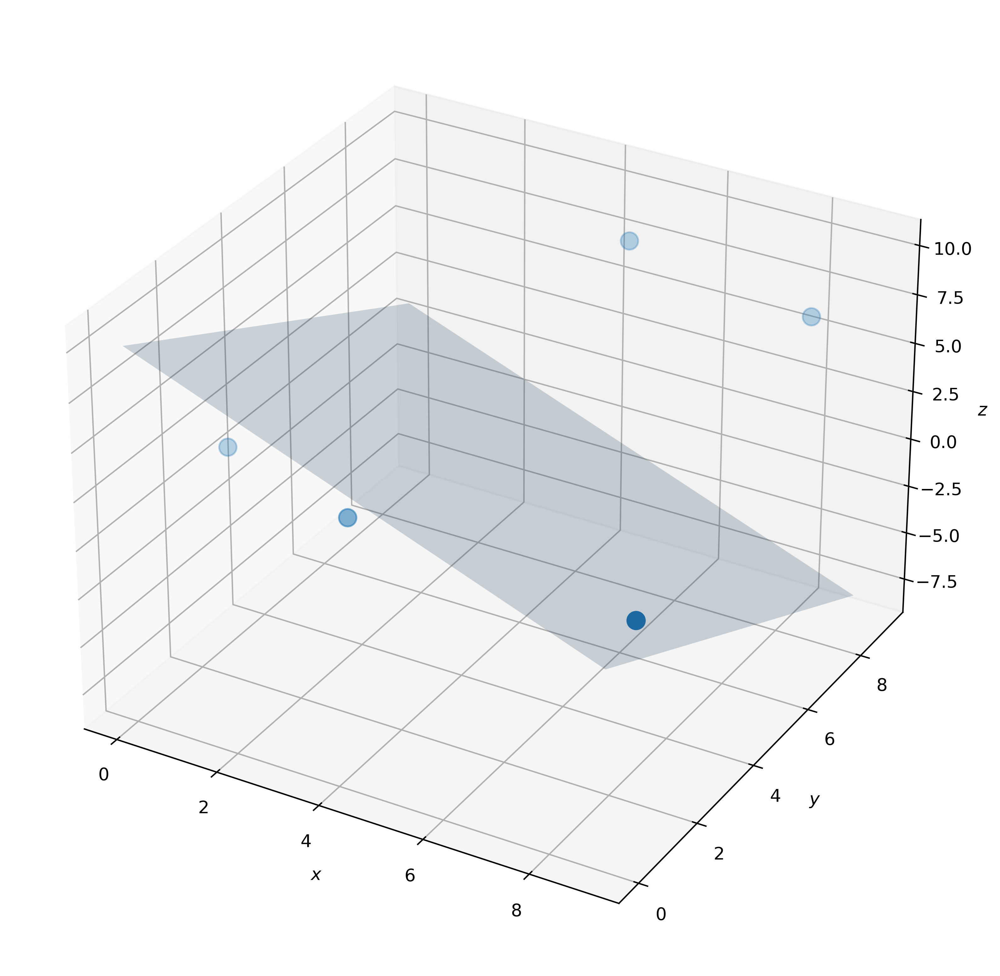

In [ ]:
x = [0, 3, 9, 8, 5]
y = [3, 2, 1, 9, 8]
z = [1, 1, 2, 6, 9]

fig = plt.figure(figsize=(10, 10), dpi=400)
ax = fig.add_subplot(projection='3d')
ax.scatter(x, y, z, s=100)

point  = np.array([1, 2,7])
normal = np.array([1, 1, 1])
d = -point.dot(normal)
xx, yy = np.meshgrid(range(10), range(10))
z = (-normal[0] * xx - normal[1] * yy - d) * 1. /normal[2]
ax.plot_surface(xx, yy, z, alpha=0.2)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
plt.show()

Let's visualize two hyper_cubes, the smaller with a side length 99% the length of the larger one, in 1, 2, and 3 dimensions.

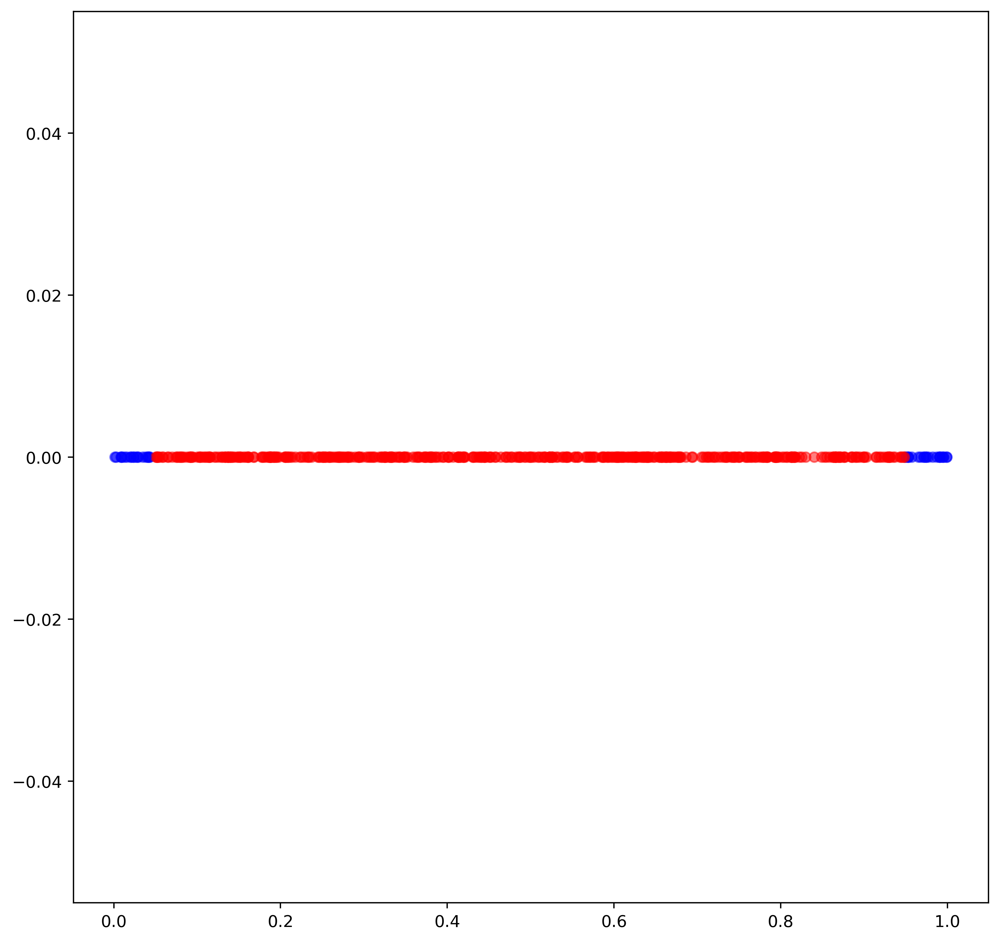

<Figure size 4000x4000 with 0 Axes>

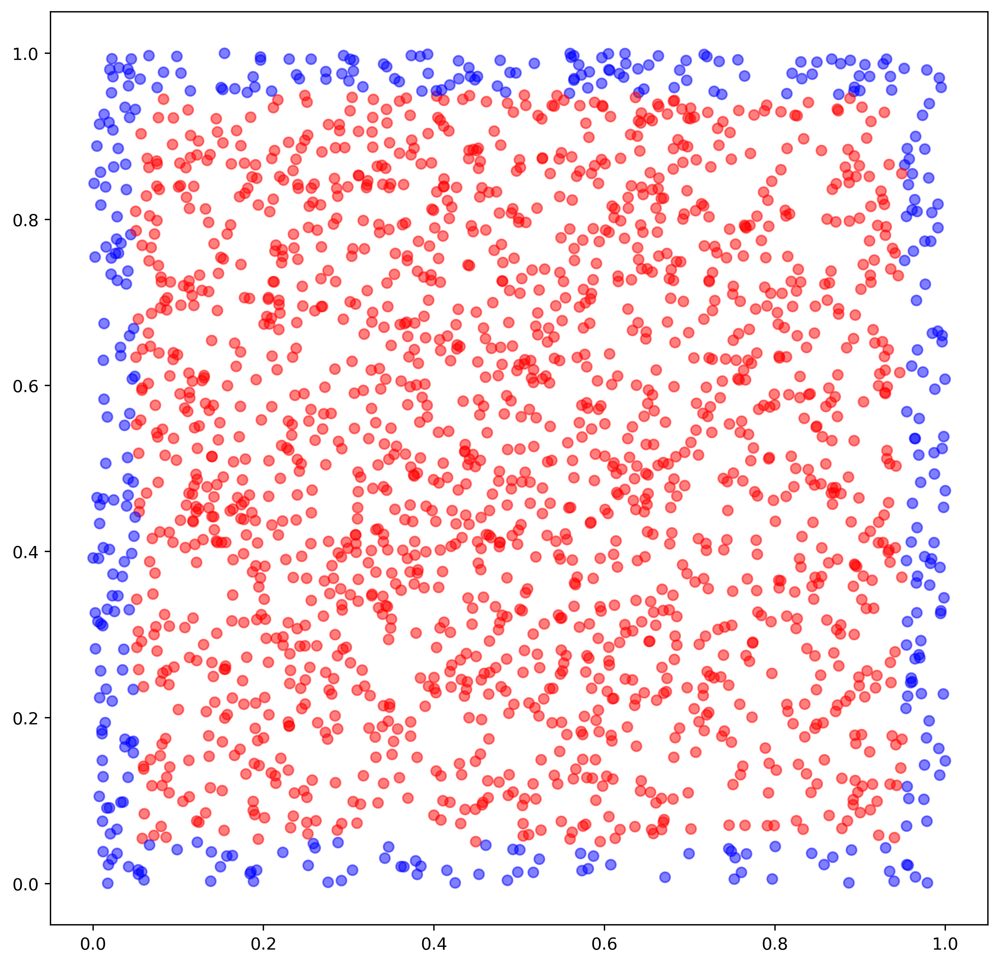

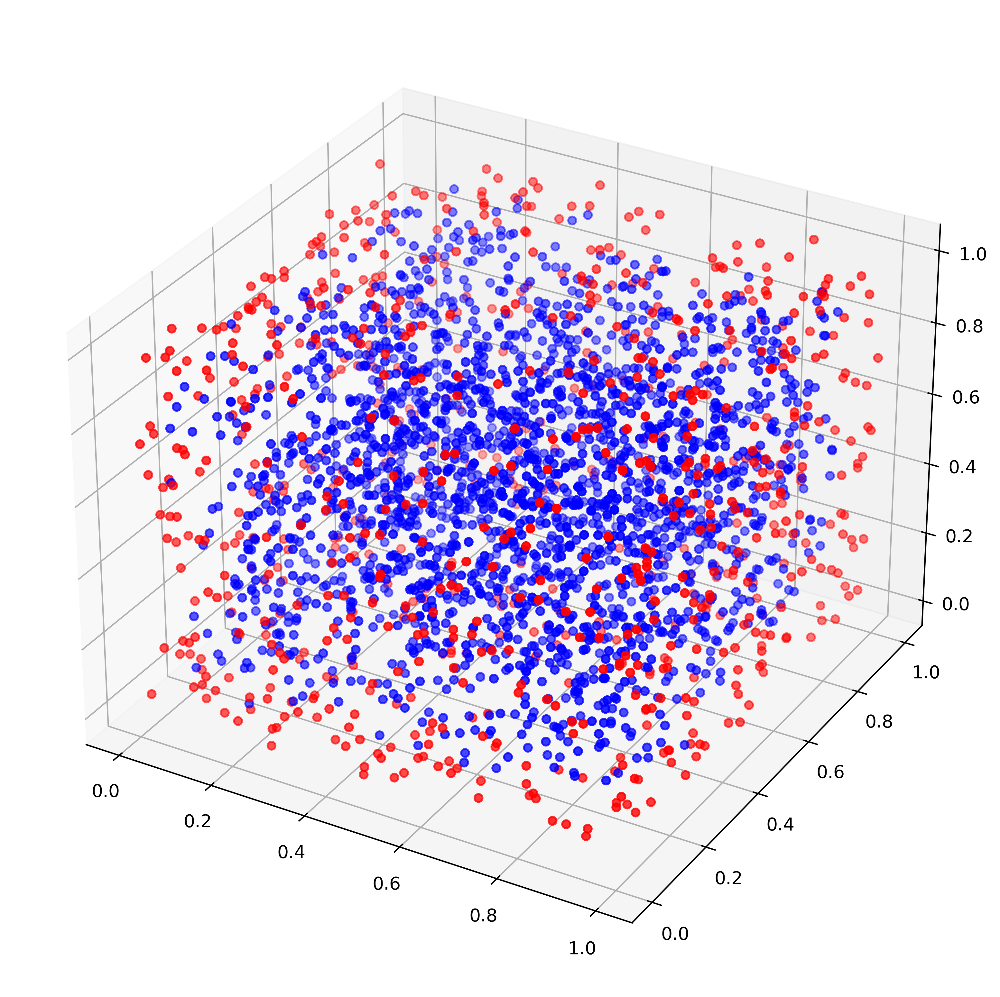

In [ ]:
plt.figure(figsize=(10, 10), dpi=400)
features = np.random.uniform(0, 1, (500))
labels = np.array(['blue' if i < 0.05 or i > 0.95 else 'red' for i in features])
plt.scatter(features, np.zeros(500), color = labels, alpha = 0.5)
plt.show()

plt.figure(figsize=(10, 10), dpi=400)
n = 2000
features = np.random.uniform(0, 1, (2, n))
labels = np.array(['blue' if (features[0, i] < 0.05 or features[0, i] > 0.95) or (features[1, i] < 0.05 or features[1, i] > 0.95) else 'red' for i in range(n)])
plt.figure(figsize=(10, 10), dpi=400)
plt.scatter(features[0], features[1], color = labels, alpha = 0.5)
plt.show()

n = 3000
fig = plt.figure(figsize=(10, 10), dpi=400)
ax = fig.add_subplot(projection='3d')
features = np.random.uniform(0, 1, (3, n))
labels = np.array(['red' if (features[0, i] < 0.05 or features[0, i] > 0.95) or (features[1, i] < 0.05 or features[1, i] > 0.95) or (features[2, i] < 0.05 or features[2, i] > 0.95) else 'blue' for i in range(n)])
ax.scatter(features[0], features[1], features[2], color = labels)
plt.show()

Let's write a generalized function to find the proportion of outside points to total points for an $n$ dimensional hyper_cube and plot the proportion per dimensionality from 1 to 1000 dimensions.

  0%|          | 0/10 [00:00<?, ?it/s]

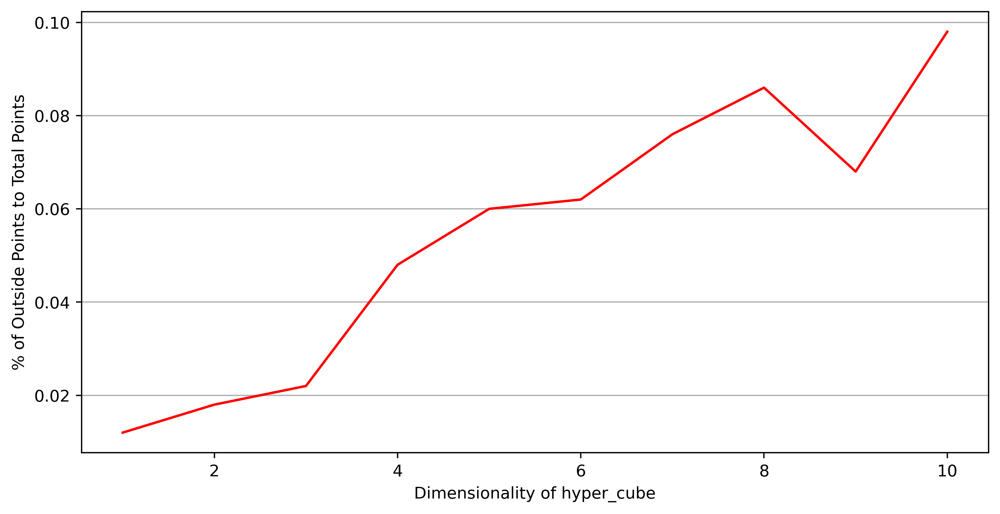

In [ ]:
def hyper_cube(dims = 1, num = 500, prop = 0.99, showBar = True):
    
    outsidePoints = 0
    totalPoints = 0
    
    if showBar: barfunc = lambda x:tqdm(x)
    else: barfunc = lambda x:x
    
    for point in barfunc(range(num)):
        totalPoints += 1
        for dim in range(dims):
            randPos = np.random.uniform(0, 1)
            if randPos < (1-prop)/2 or randPos > 1 - (1-prop)/2:
                outsidePoints += 1
                break
                
    return outsidePoints/totalPoints

# book figure uses max dimension 1000, set x to range(1, 1001) to reproduce (Figure 1-27)

x = range(1, 11)
y = []
for x_dim in tqdm(x):
    y.append(hyper_cube(dims = x_dim, showBar = False))
    
plt.figure(figsize=(10, 5), dpi=400)
plt.plot(x, y, color='red')
plt.ylabel('% of Outside Points to Total Points')
plt.xlabel('Dimensionality of hyper_cube')
axes = plt.gca()
axes.yaxis.grid()
plt.show()

The distance between the second longest distance of two points and the longest distance of two points changes to zero as the dimensionality of a hyper_cube increases.

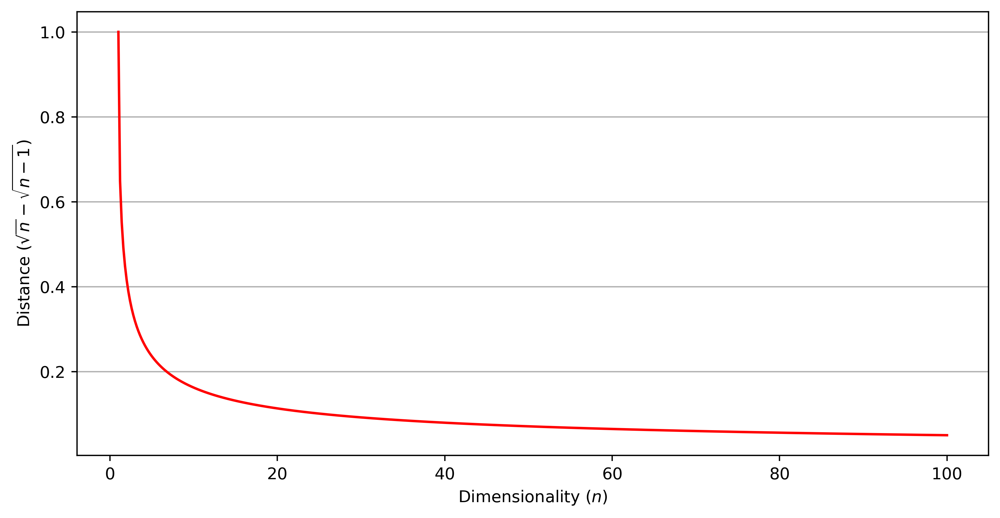

In [ ]:
features = np.linspace(1, 100, 500)
labels = np.sqrt(features) - np.sqrt(features - 1)
plt.figure(figsize=(10, 5), dpi=400)
plt.plot(features, labels, color='red')
axes = plt.gca()
axes.yaxis.grid()
plt.ylabel('Distance ($\sqrt{n} - \sqrt{n-1}$)')
plt.xlabel('Dimensionality ($n$)')
plt.show()

Let us evaluate the distance between two sample points $(0, 0)$ and $(2, 1)$ for different norms.

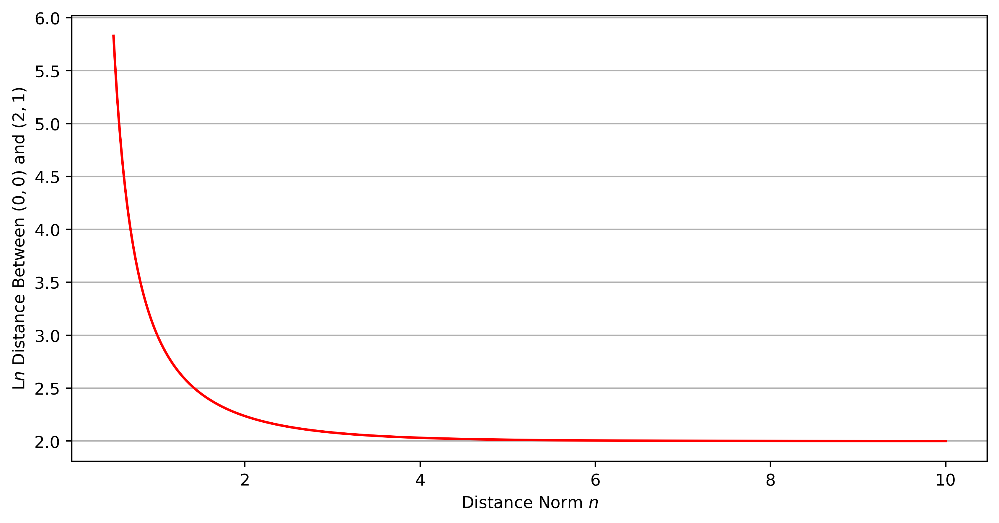

In [ ]:
features = np.linspace(0.5, 10, 500)
labels = np.power((2**features) + 1, 1/features)
plt.figure(figsize=(10, 5), dpi=400)
plt.plot(features, labels, color='red')
axes = plt.gca()
axes.yaxis.grid()
plt.ylabel('L$n$ Distance Between $(0, 0)$ and $(2, 1)$')
plt.xlabel('Distance Norm $n$')
plt.show()

### Optimization and Gradient Descent

Source code for Figure (1.x) - visualizing gradient descent. Sampled values and functions were manually discovered and tuned.

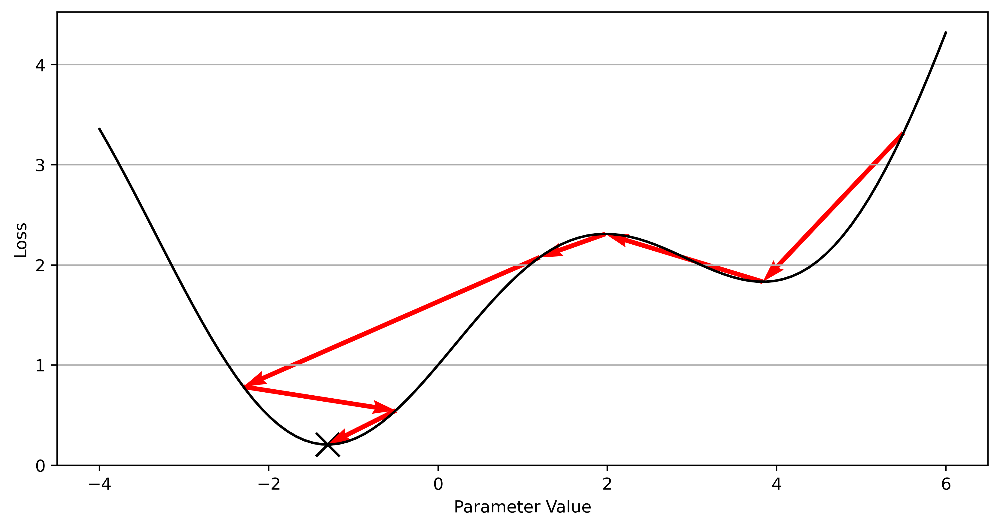

In [ ]:
features = np.linspace(-4, 6, 100)
targets = np.sin(features) + features**2/10 + 1

f = lambda x:np.sin(x) + x**2/10 + 1

plt.figure(figsize=(10, 5), dpi=400)
axes = plt.gca()
axes.yaxis.grid()

plt.scatter([-1.306], [0.205], color='black', marker='x', s=200)
x = np.array([5.5, 3.837, 1.977, 1.2, -2.3, -0.5, -1.306])
axes.quiver(x[:-1], 
          f(x)[:-1], 
          ([x[i+1]-x[i] for i in range(len(x[:-1]))]), 
          ([f(x)[i+1]-f(x)[i] for i in range(len(f(x)[:-1]))]), 
          angles='xy', 
          scale_units='xy', 
          scale=1,
          linestyle='--',
          width=0.005,
          color='red')

plt.plot(features, targets, color='black')

plt.ylabel('Loss')
plt.xlabel('Parameter Value')

plt.show()

Let's plot various gradient descent minimizations for the function $\sin x + \frac{x^2}{10} + 1$.

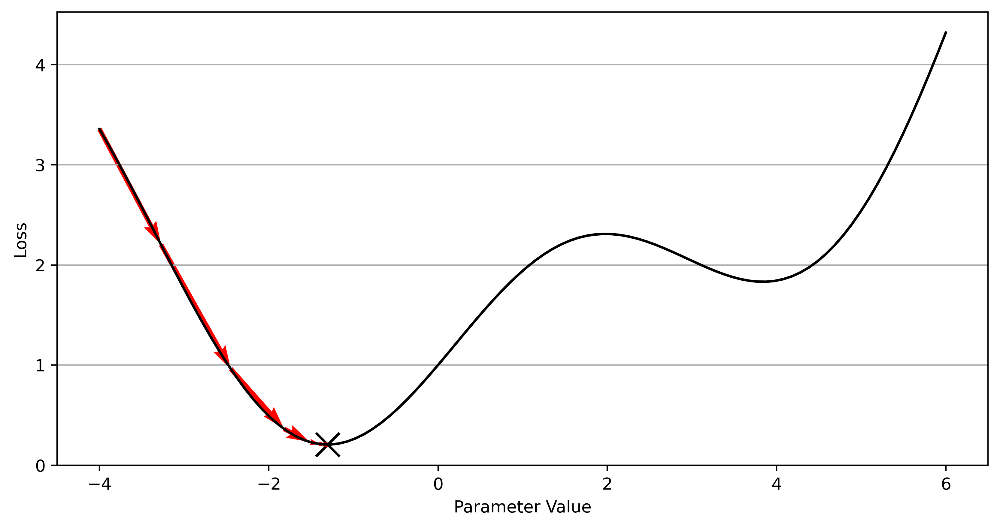

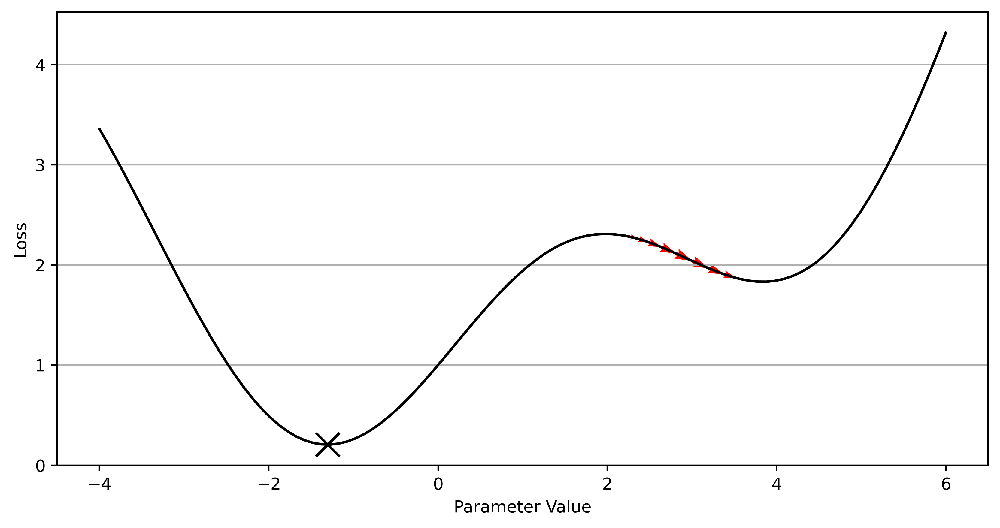

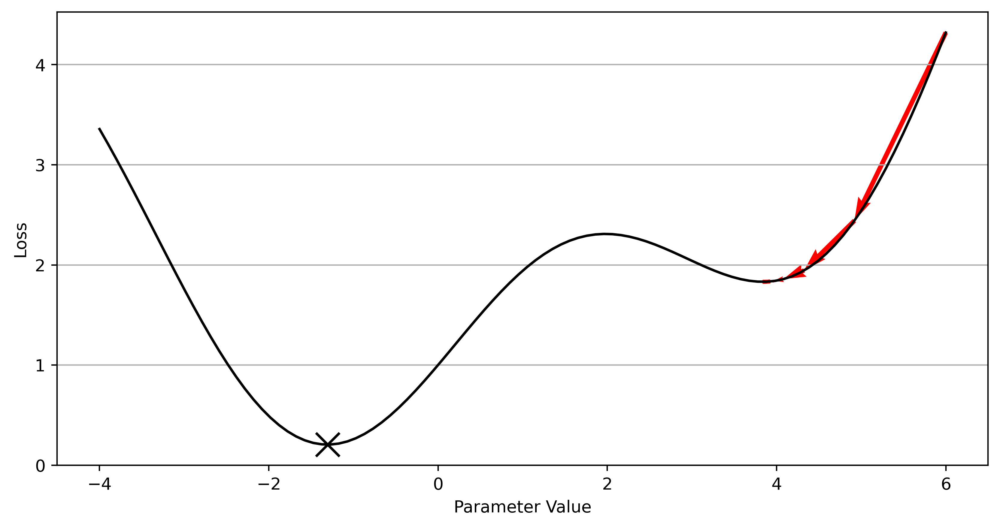

In [ ]:
def plot_gd_min(learn_rate = 0.5, curr_x = 6):

    cost = lambda x: np.sin(x) + x**2 / 10 + 1
    gradient = lambda x: np.cos(x) + 2*x / 10

    x = []
    for iteration in range(10):
        x.append(curr_x)
        curr_x += -learn_rate * gradient(curr_x)

    features = np.linspace(-4, 6, 100)
    targets = np.sin(features) + features**2/10 + 1

    f = lambda x:np.sin(x) + x**2/10 + 1

    plt.figure(figsize=(10, 5), dpi=400)
    axes = plt.gca()
    axes.yaxis.grid()

    plt.scatter([-1.306], [0.205], color='black', marker='x', s=200)
    x = np.array(x)
    axes.quiver(x[:-1], 
              f(x)[:-1], 
              ([x[i+1]-x[i] for i in range(len(x[:-1]))]), 
              ([f(x)[i+1]-f(x)[i] for i in range(len(f(x)[:-1]))]), 
              angles='xy', 
              scale_units='xy', 
              scale=1,
              linestyle='--',
              width=0.005,
              color='red')

    plt.plot(features, targets, color='black')

    plt.ylabel('Loss')
    plt.xlabel('Parameter Value')

    plt.show()

plot_gd_min(learn_rate = 0.5, curr_x = -4)
plot_gd_min(learn_rate = 0.5, curr_x = 2.2)
plot_gd_min(learn_rate = 0.5, curr_x = 6)

Plotting a simple linear regression fitting example with gradient descent.

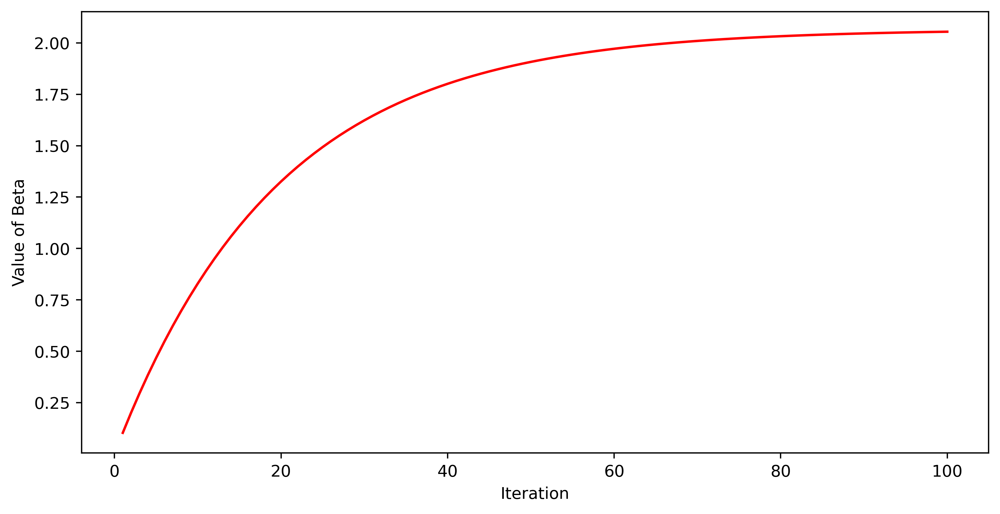

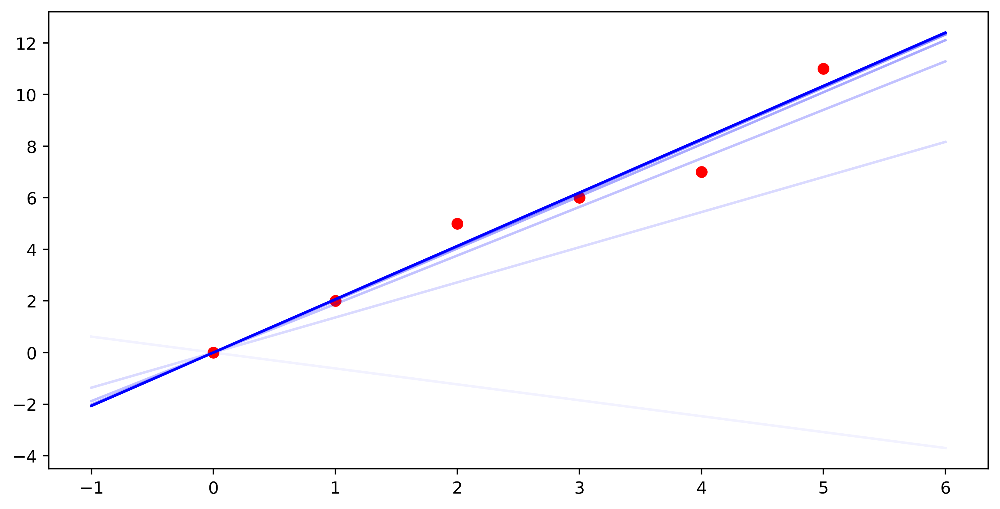

In [ ]:
x = np.array([0, 1, 2, 3, 4, 5])
y = np.array([0, 2, 5, 6, 7, 11])

def predict(beta, x):
    return beta * x

def gradient(beta, x, y):
    errors = predict(beta, x) - y
    return np.mean(errors)

# plot value of beta over time
learn_rate = 0.02
curr_beta = 0
history = []

for iteration in range(100):
    curr_beta += -learn_rate * gradient(curr_beta, x, y)
    history.append(curr_beta)

plt.figure(figsize=(10, 5), dpi=400)
plt.plot(np.arange(1, 101), history, color='red')
plt.xlabel('Iteration')
plt.ylabel('Value of Beta')
plt.show()

# plot how line changes across iterations
# (plot every 10 iterations with increasing boldness)
learn_rate = 0.05
curr_beta = -1

plt.figure(figsize=(10, 5), dpi=400)

for iteration in range(100):
    curr_beta += -learn_rate * gradient(curr_beta, x, y)
    
    if iteration % 10 == 0:
        px = np.linspace(-1, 6, 100)
        py = curr_beta * px
        plt.plot(px, py, alpha=1 - (1 - iteration/100) * 0.95, color='blue')

plt.scatter(x, y, color='red')

plt.show()

---

---

## Metrics and Evaluation

In [ ]:
# Example data
# Regression
# "Ground-truth values"
y_reg_true = np.random.uniform(0, 20, 50)        # Randomly generates number from uniform distribution with range 0 to 20 of size (50, 1)
# Model predictions
y_reg_pred = np.random.uniform(0, 20, 50)

#Classification
y_class_true = np.random.randint(2, size=50)        # Randomly generates 1s and 0s of size (50, 1)
# Represents the probabilstic predictions from models
y_class_pred = np.random.uniform(0, 1, 50)        # Randomly generates number from uniform distribution with range 0 to 1 of size (50, 1), 

### Mean Absolute Error (MAE)

In [ ]:
# Implementation in Numpy
def mean_absolute_error(y_true, y_pred):
    # Check if y_true and y_pred are the same shape
    assert y_pred.shape == y_true.shape
    return np.sum(np.absolute(y_pred-y_true))/len(y_pred)

print(f"Numpy Implementation of MAE: {mean_absolute_error(y_reg_true, y_reg_pred)}")

# Implementation in Sklearn
from sklearn.metrics import mean_absolute_error

# Usage
print(f"Sklearn Implementation of MAE: {mean_absolute_error(y_reg_true, y_reg_pred)}")

Numpy Implementation of MAE: 6.446636506271392
Sklearn Implementation of MAE: 6.446636506271392


### Mean Squared Error (MSE)

In [ ]:
# Implemnetation in Numpy
def mean_squared_error(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
    assert y_pred.shape == y_true.shape
    return np.sum((y_pred-y_true)**2)/len(y_pred)

print(f"Numpy Implementation of MSE: {mean_squared_error(y_reg_true, y_reg_pred)}")

# Implementation in Sklearn
from sklearn.metrics import mean_squared_error

# Usage
print(f"Sklearn Implementation of MSE: {mean_squared_error(y_reg_true, y_reg_pred)}")

Numpy Implementation of MSE: 63.50136689708434
Sklearn Implementation of MSE: 63.50136689708434


### Root Mean Squared Error (RMSE)

In [ ]:
print(f"RMSE: {mean_squared_error(y_reg_true, y_reg_pred) ** (1/2)}")

RMSE: 7.968774491544126


### Area Under Reciver Operating Characteristic Curve (AUC-ROC)

In [ ]:

def get_tpr_fpr(y_pred, y_true):
    tp = (y_pred == 1) & (y_true == 1)
    tn = (y_pred == 0) & (y_true == 0)
    fp = (y_pred == 1) & (y_true == 0)
    fn = (y_pred == 0) & (y_true == 1)

    tpr = tp.sum() / (tp.sum() + fn.sum())
    fpr = fp.sum() / (fp.sum() + tn.sum())

    return tpr, fpr

def roc_curve(y_pred, y_true, n_thresholds=15000):
    fpr_thresh = []
    tpr_thresh = []
    for i in range(n_thresholds + 1):
        
        threshold_vector = (y_pred >= i/n_thresholds)
        tpr, fpr = get_tpr_fpr(threshold_vector, y_true)
        fpr_thresh.append(fpr)
        tpr_thresh.append(tpr)
        
    return tpr_thresh, fpr_thresh


# Implementation in Numpy
def area_under_roc_curve(y_true, y_pred):
    fpr, tpr = roc_curve(y_pred, y_true)
    rectangle_roc = 0
    for k in range(len(fpr) - 1):
            rectangle_roc = rectangle_roc + (fpr[k]- fpr[k + 1]) * tpr[k]
    return 1 - rectangle_roc

In [ ]:
from sklearn.metrics import roc_auc_score
print(f"Numpy Implementation of ROC-AUC: {area_under_roc_curve(y_class_true, y_class_pred)}")
print(f"Sklearn implementation of ROC-AUC: {roc_auc_score(y_class_true, y_class_pred)}")

Numpy Implementation of ROC-AUC: 0.5467980295566504
Sklearn implementation of ROC-AUC: 0.5467980295566502


As you can see, our custom implementation differs slightly from scikit-learn's. This is because scikit-learn uses a slightly different calculation, but both capture the same idea!

### Precision and Recall

In [ ]:
# Convert probability values into integers
y_class_pred = np.rint(y_class_pred)

# Precision
# number of correctly classified positive values/number of all predicted positive values
def precision(y_true, y_pred):
    assert y_true.shape == y_pred.shape    
    return ((y_pred == 1) & (y_true == 1)).sum() / y_pred.sum()
print(f"Numpy Precision: {precision(y_class_true, y_class_pred)}")

# Recall
# number of correctly classified positive values/number of all true positive values
def recall(y_true, y_pred):
    assert y_true.shape == y_pred.shape
    return ((y_pred == 1) & (y_true == 1)).sum() / y_true.sum()
print(f"Numpy Recall: {recall(y_class_true, y_class_pred)}")

from sklearn.metrics import recall_score, precision_score
print(f"Sklearn Precision {precision_score(y_class_true, y_class_pred)}")
print(f"Sklearn Recall: {recall_score(y_class_true, y_class_pred)}")

Numpy Precision: 0.5
Numpy Recall: 0.5238095238095238
Sklearn Precision 0.5
Sklearn Recall: 0.5238095238095238


### Accuracy

In [ ]:
def accuracy(y_true, y_pred):
    assert y_true.shape == y_pred.shape
    # returns a boolean array(of 1s and 0s) indicating if element of both arrays match
    return np.average(y_true == y_pred)

from sklearn.metrics import accuracy_score

print(f"Numpy Accuracy: {accuracy(y_class_true, y_class_pred)}")
print(f"Sklearn Accuracy: {accuracy_score(y_class_true, y_class_pred)}")

Numpy Accuracy: 0.58
Sklearn Accuracy: 0.58


### F1 Score

In [ ]:
# F1 Score
# Harmonic Mean of Precision and Recall

def f1_score(y_true, y_pred):
    return (2*precision(y_true, y_pred)*recall(y_true, y_pred)) / (precision(y_true, y_pred)+recall(y_true, y_pred))

print(f"Numpy Implementation of F1 Score: {f1_score(y_class_true, y_class_pred)}")
    
from sklearn.metrics import f1_score

print(f"Sklearn Implementation of F1 Socre: {f1_score(y_class_true, y_class_pred)}")

Numpy Implementation of F1 Score: 0.5116279069767442
Sklearn Implementation of F1 Socre: 0.5116279069767442


---

---

## Algorithms

### K-Nearest Neighbors (KNN)

#### Implementation from scratch

In [ ]:
def minkowski_distance(x, y, p=2):
    return (np.abs(x - y)**p).sum()**(1/p)

def calculate_distance(X_train, single_test, distance_function):
    distances = []
    
    for single_train in X_train:
        single_distance = distance_function(single_train, single_test)
        distances.append(single_distance)
    
    return distances

from collections import Counter

def knn_predict_single(distances, y_train, k=7):
    
    # Convert distances to series with the index being the index of y_train
    distances = pd.Series(distances, index=list(range(len(y_train))))
    
    # Sort values and select first K elements while preserving index
    k_neighbors = distances.sort_values()[:k]
    
    # Create list with the lables of each `k_neighbor`
    counter = Counter(y_train[k_neighbors.index])
        
    # Most common label in the list
    prediction = counter.most_common()[0][0]
    
    return prediction

def knn_pred(X_train, y_train, X_test, distance_function, k):
    
    predictions = np.array([])
    
    # Loop through every test sample
    for test in X_test:
        distances = calculate_distance(X_train, test, distance_function)
        single_pred = knn_predict_single(distances, y_train, k)
        predictions = np.append(predictions, [single_pred])
        
    return predictions

Let's evaluate our model on the Iris Dataset.

In [ ]:
from sklearn import datasets

iris = datasets.load_iris()

# assign X(features) and y(targets)
X = iris.data
y = iris.target

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# predict using knn
predictions = knn_pred(X_train, y_train, X_test, minkowski_distance, k=5)

from sklearn.metrics import accuracy_score
# returns 1.0
accuracy_score(y_test, predictions)

1.0

#### Scikit-Learn Implementation

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# create object
neigh = KNeighborsClassifier(n_neighbors=5)
# call fit on training data
neigh.fit(X_train, y_train)
# predict on testing data
sklearn_pred = neigh.predict(X_test)
# returns 1.0
accuracy_score(y_test, sklearn_pred)

1.0

#### Graphing Elbow Method

Text(-10, -40, 'Optimal K')

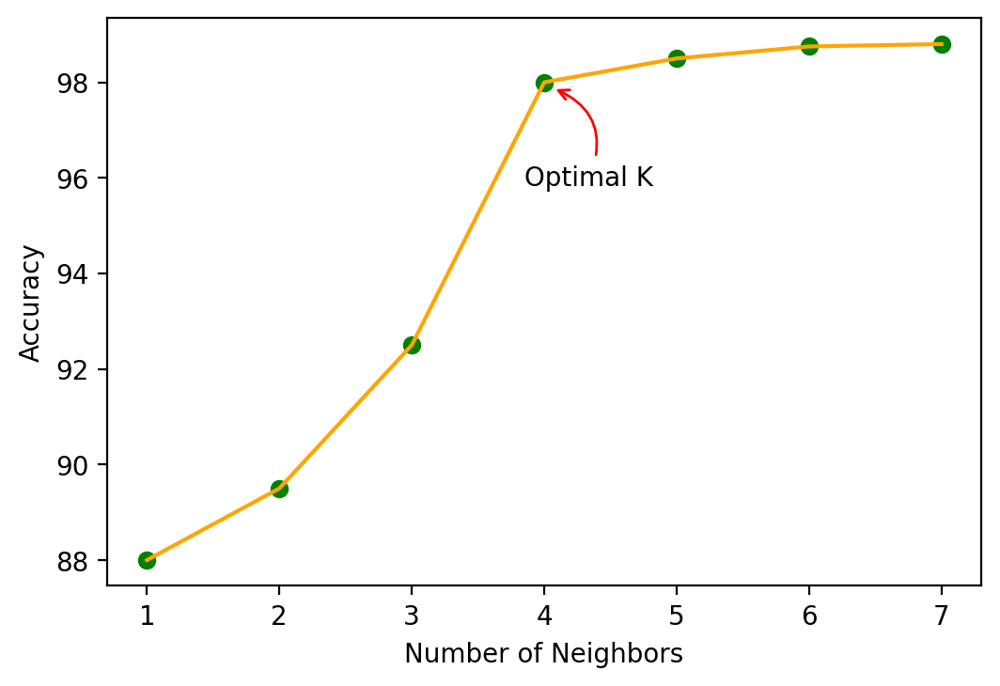

In [ ]:
# Demostration of Elbow Method

import matplotlib.pyplot as plt
from matplotlib import rcParams

points_x = [1, 2, 3, 4, 5, 6, 7]
points_y = [88, 89.5, 92.5, 98, 98.5, 98.75, 98.8]

plt.xlabel("Number of Neighbors")
plt.ylabel("Accuracy")
plt.gcf().set_dpi(200)
plt.plot(points_x, points_y, c='orange')
plt.scatter(points_x, points_y, c='green')
plt.annotate('Optimal K', xy=(4.05, 97.9), xytext=(-10,-40), 
            textcoords='offset points', ha='left', va='bottom',
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.5', 
                            color='red'))

### Linear Regression

#### Visualization of MSE on Linear Regression

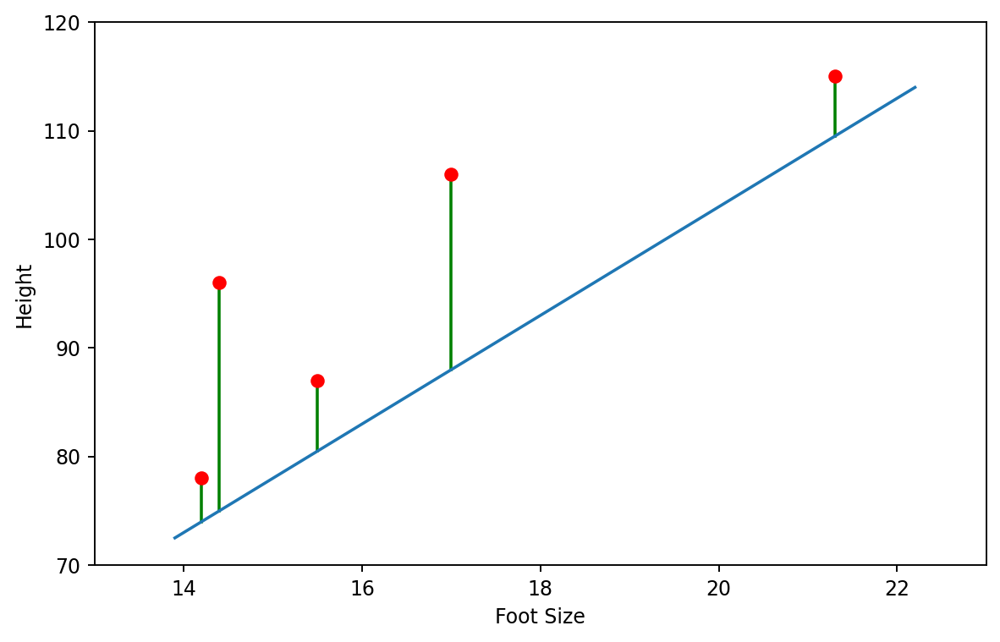

In [ ]:
import matplotlib.pyplot as plt

foot_size = np.array([14.2, 21.3, 17, 15.5, 14.4])
height = np.array([78, 115, 106, 87, 96])

xlim = (13, 23)
ylim = (70, 120)

x = np.linspace(xlim[0] + 0.9, xlim[1] - 0.8, 100)
initial_guess = lambda x: 5*x + 3
y = initial_guess(x)

plt.figure(figsize=(8, 5), dpi=170)
plt.xlabel("Foot Size")
plt.ylabel("Height")
plt.xlim(xlim)
plt.ylim(ylim)
plt.scatter(foot_size, height, c="red")
plt.plot(x, y)

for x_v, y_v in zip(foot_size, height):
    plt.plot([x_v, x_v], [y_v, initial_guess(x_v)], c='green', zorder=0,)

#### Gradient Decent Intuition

Text(10, -20, 'Lowest Loss')

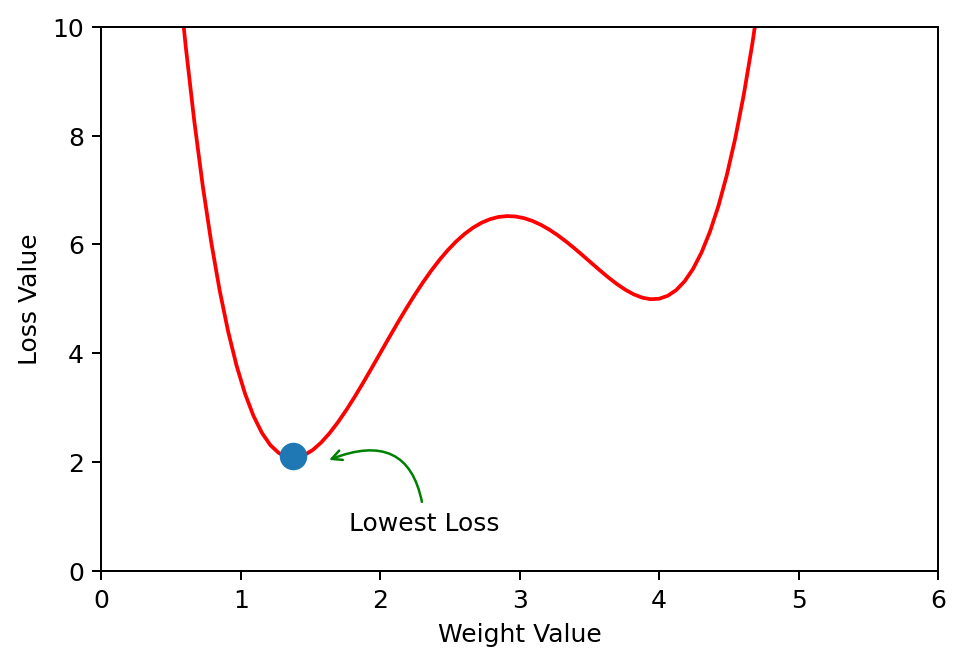

In [ ]:
xlim = (0, 6)
ylim = (0, 10)
plt.figure(dpi=180)
plt.xlim(xlim)
plt.ylim(ylim)
plt.xlabel("Weight Value")
plt.ylabel("Loss Value")

fn = lambda x: (x-2)**4 - 3*(x-2)**3 + 4.5*(x-2) + 4
x = np.linspace(xlim[0], xlim[1], 100)
y = fn(x)
plt.plot(x, y, c="red")
plt.scatter([1.375], [2.1], s=100, zorder=10)
plt.annotate('Lowest Loss', xy=(1.6, 2), xytext=(10, -20), 
            textcoords='offset points', ha='left', va='top',
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.7', 
                            color='green'))

#### Simple LR

In [ ]:
# define our example dataset 
foot_size = np.array([14.2, 21.3, 17, 15.5, 14.4])
height = np.array([78, 115, 106, 87, 96])

# foot_size is `x` while height is `y_true`

# MSE cost function
def mse_loss_func(y_true, y_pred):
    return np.sum((y_pred-y_true)**2)/len(y_pred)

# prediction function, namely the equation for the line, y=beta*x+epsilon
def predict(beta, epsilon, x):
    return beta*x + epsilon

# calculates the partial weight derivative
def weight_deriv(beta, epsilon, x, y_true):
    error = predict(beta, epsilon, x) - y_true
    return np.mean(2 * error * x)

# calculates the bias term
def calculate_bias(beta, x, y_true):
    return np.mean(y_true - beta * x)

In [ ]:
def gradient_decent(beta, epsilon, x, y_true, alpha):

    weight_derivative = weight_deriv(beta, epsilon, x, y_true)
    new_beta = -alpha * weight_derivative
    return new_beta

In [ ]:
epsilon = 0
beta = 1


# usually a value between 0.001 and 0.0001 works well
alpha = 0.00001

iterations = 200

for i in range(1, iterations + 1):
    beta += gradient_decent(beta, epsilon, foot_size.reshape(-1, 1), height, alpha)
    
    # evaluate every 20 iterations
    if i%20 == 0:
        pred = predict(beta, epsilon, foot_size.reshape(-1, 1))
        mse = mse_loss_func(height, pred)
        print(f"Error at iteration {i}: {mse}")

# Calculate the bias
epsilon = calculate_bias(beta, foot_size.reshape(-1, 1), height)
final_pred = predict(beta, epsilon, foot_size)
final_mse = mse_loss_func(height, final_pred.flatten())
print(f"Final Prediction with bias has error: {final_mse}")

Error at iteration 20: 26663.463092839425
Error at iteration 40: 21726.99143201574
Error at iteration 60: 17778.561053975038
Error at iteration 80: 14620.414199013996
Error at iteration 100: 12094.374582621012
Error at iteration 120: 10073.925111259905
Error at iteration 140: 8457.871253738651
Error at iteration 160: 7165.272697116512
Error at iteration 180: 6131.389438334303
Error at iteration 200: 5304.43927092621
Final Prediction with bias has error: 46.6555243829795


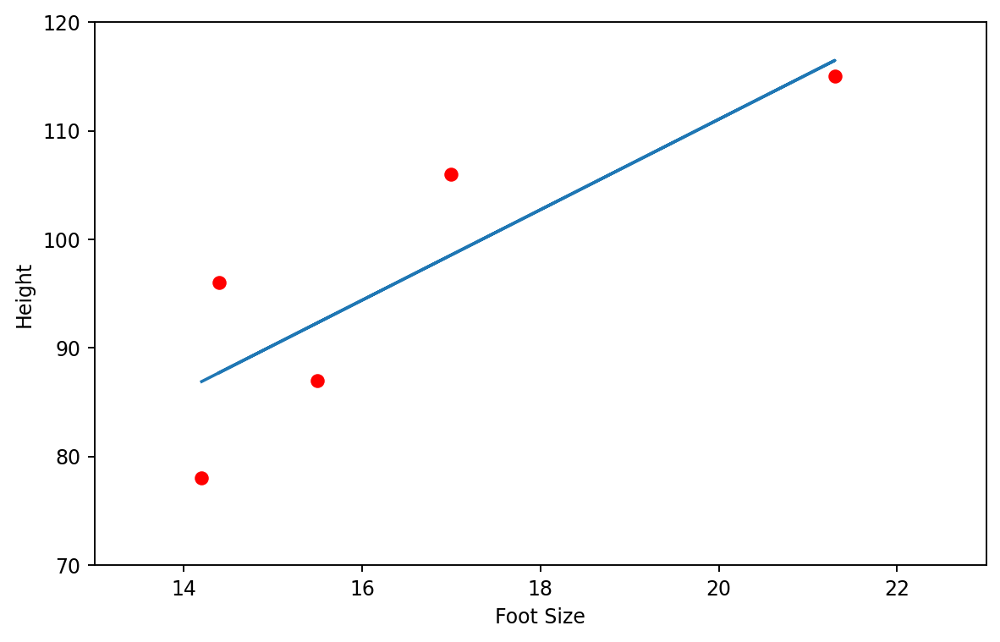

In [ ]:
final_func = lambda x: x*beta + epsilon
y_pred = final_func(foot_size)

xlim = (13, 23)
ylim = (70, 120)

plt.figure(figsize=(8, 5), dpi=170)
plt.xlabel("Foot Size")
plt.ylabel("Height")
plt.xlim(xlim)
plt.ylim(ylim)
plt.scatter(foot_size, height, c="red")
plt.plot(foot_size, y_pred)

#### Sklearn LR

Sklearn Linear Regression mse: 46.505401906555264


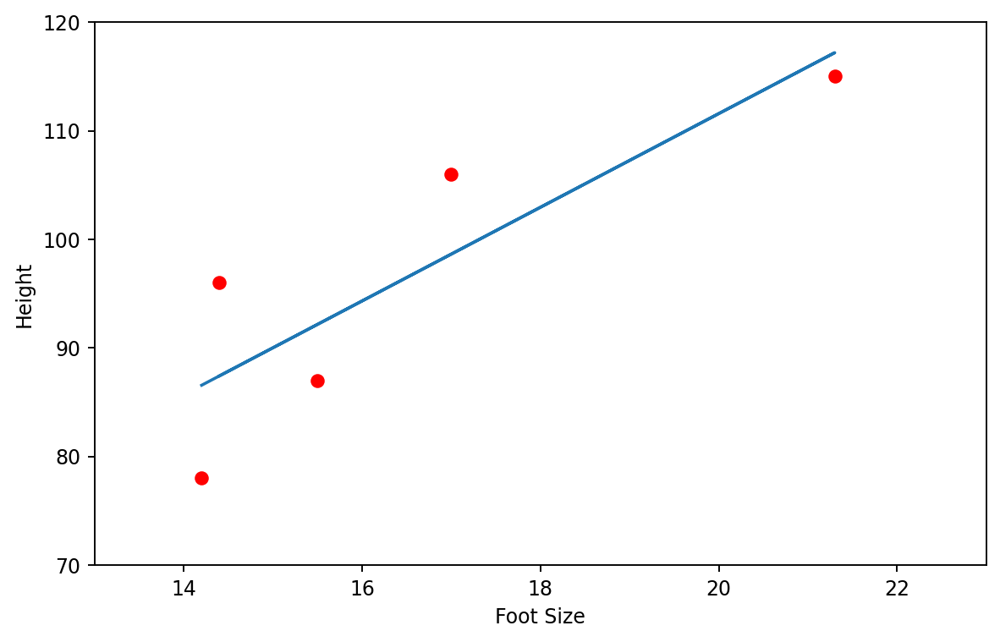

In [ ]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(foot_size.reshape(-1, 1), height)
beta = lr.coef_
epsilon = lr.intercept_

# Predict function
lr_pred = lr.predict(foot_size.reshape(-1, 1))

print(f"Sklearn Linear Regression mse: {mse_loss_func(height, lr_pred)}")

final_func = lambda x: x*beta + epsilon
y_pred = final_func(foot_size)

xlim = (13, 23)
ylim = (70, 120)

plt.figure(figsize=(8, 5), dpi=170)
plt.xlabel("Foot Size")
plt.ylabel("Height")
plt.xlim(xlim)
plt.ylim(ylim)
plt.scatter(foot_size, height, c="red")
plt.plot(foot_size, y_pred)

In [ ]:
# epsilon
print(lr.coef_)
# beta
print(lr.intercept_)

[4.31446393]
25.2976344592209


In [ ]:
mse_loss_func(height, y_pred)

46.505401906555264

#### Multivariate LR

In [ ]:
# define our example dataset 
foot_size = np.array([14.2, 21.3, 17, 15.5, 14.4])
height = np.array([78, 115, 106, 87, 96])

# foot_size is `x` while height is `y_true`

# MSE cost function
def mse_loss_func(y_true, y_pred):
    return np.sum((y_pred-y_true)**2)/len(y_pred)

# prediction function, namely the equation for the line, y=beta*x+epsilon
def predict(beta, epsilon, x):
    return np.dot(x, beta) + epsilon

# calculates the partial weight derivative
def weight_deriv(beta, epsilon, x, y_true):
    error = predict(beta, epsilon, x) - y_true
    return np.mean(2 * np.dot(x.T, error))

# calculates the bias term
def calculate_bias(beta, x, y_true):
    return np.mean(y_true - np.dot(x, beta))

In [ ]:

epsilon = 0
beta = np.array([1.]).reshape(1, -1)


# usually a value between 0.001 and 0.0001 works well
alpha = 0.00001

iterations = 200

for i in range(1, iterations + 1):
    beta += gradient_decent(beta, epsilon, foot_size.reshape(-1, 1), height, alpha)
    
    # evaluate every 20 iterations
    if i%20 == 0:
        pred = predict(beta, epsilon, foot_size.reshape(-1, 1))
        mse = mse_loss_func(height, pred)
        print(f"Error at iteration {i}: {mse}")

# Calculate the bias
epsilon = calculate_bias(beta, foot_size.reshape(-1, 1), height)
final_pred = predict(beta, epsilon, foot_size.reshape(-1, 1))
final_mse = mse_loss_func(height, final_pred.flatten())
print(f"Final Prediction with bias has error: {final_mse}")

Error at iteration 20: 11967.160738095885
Error at iteration 40: 5221.67204980424
Error at iteration 60: 3041.2288627879743
Error at iteration 80: 2336.4122495664756
Error at iteration 100: 2108.584044167187
Error at iteration 120: 2034.9397937312956
Error at iteration 140: 2011.1346831535288
Error at iteration 160: 2003.439808315838
Error at iteration 180: 2000.9524811272374
Error at iteration 200: 2000.1484658997447
Final Prediction with bias has error: 59.368496557992636


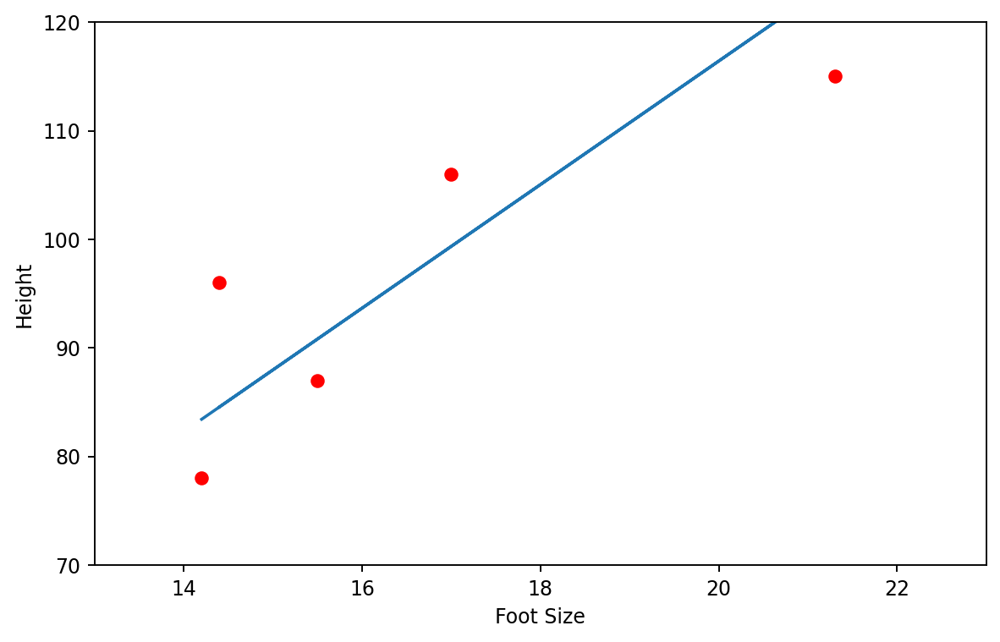

In [ ]:
final_func = lambda x: x*beta + epsilon
y_pred = final_func(foot_size)

xlim = (13, 23)
ylim = (70, 120)

plt.figure(figsize=(8, 5), dpi=170)
plt.xlabel("Foot Size")
plt.ylabel("Height")
plt.xlim(xlim)
plt.ylim(ylim)
plt.scatter(foot_size, height, c="red")
plt.plot(foot_size, y_pred.flatten())

#### Regularization LRs

In [ ]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet

# alpha is the lambda value
ridge = Ridge(alpha=1.0)

lasso = Lasso(alpha=1.0)

# alpha is the penalty term for both while the l1_ratio controls how much penalty is weighted toward l1, the closer to 1 the higher weight to l1
elr = ElasticNet(alpha=1.0, l1_ratio=0.5)

# Fit and predict as normal where X and y are training features and training targets, respectively
# Replace X and y with your own data
# ridge.fit(X, y)
# lasso.fit(X, y)
# elr.fit(X, y)

# ridge.predict(X_test)
# lasso.predict(X_test)
# elr.predict(X_test)

### Logistic Regression

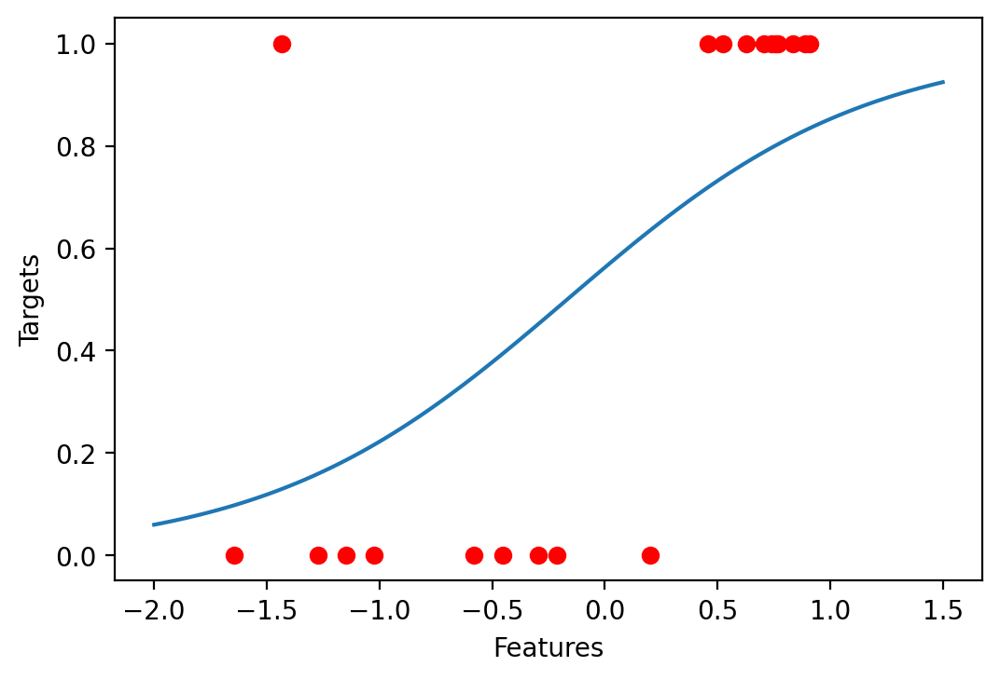

In [ ]:
# Visualize Logistic Regression's Line of Best Fit
from sklearn.datasets import make_classification

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

X, y = make_classification(n_samples = 20, n_features = 1, n_informative = 1, n_redundant = 0, flip_y=0.15, class_sep=0.8, n_clusters_per_class=1)

plt.figure(dpi=200)
plt.xlabel("Features")
plt.ylabel("Targets")
plt.scatter(X, y, c='red')

from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X, y)

# Retreives the weight and bias
w = lr.coef_
b = lr.intercept_

#Returns probability
pred_prob = lr.predict_proba(X)

#Returns binary labels
pred_binary = lr.predict(X)

X = np.linspace(-2, 1.5, 100)
fn = lambda x: sigmoid(w*x + b)
y = fn(X)

plt.plot(X, y.reshape(-1,))

#### Logistic Regression from Scratch

In [ ]:
# for log loss, we will be using the sklearn implementation
from sklearn.metrics import log_loss

# the sigmoid function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# logloss/BCE cost function
def bce_loss_func(y_true, y_pred):
    return log_loss(y_true, y_pred)

# prediction function, namely the equation for the line, y=sigmoid(beta*x+epsilon)
def predict(beta, epsilon, x):
    linear_pred = np.dot(x, beta) + epsilon
    return sigmoid(linear_pred)

# calculates the partial weight derivative
def weight_deriv(beta, epsilon, x, y_true):
    error = predict(beta, epsilon, x) - y_true
    return np.mean(np.dot(x.T, error))

# calculates the partial bias derivative
def bias_deriv(beta, epsilon, x, y_true):
    error = predict(beta, epsilon, x) - y_true
    return np.mean(np.sum(error))

In [ ]:
def gradient_decent(beta, epsilon, x, y_true, alpha):
    
    # Update weight
    weight_derivative = weight_deriv(beta, epsilon, x, y_true)
    new_beta = beta - alpha * weight_derivative
    
    #Update bias
    bias_derivative = bias_deriv(beta, epsilon, x, y_true)
    new_epsilon = epsilon - alpha * bias_derivative

    
    return new_beta, new_epsilon

In [ ]:
X, y = make_classification(n_samples = 20, n_features = 1, n_informative = 1, n_redundant = 0, 
                           flip_y=0.025, n_clusters_per_class=1, random_state=42)

In [ ]:
epsilon = 0
beta = 100


# usually a value between 0.001 and 0.0001 works well
alpha = 0.1

iterations = 100

for i in range(1, iterations + 1):
    
    beta, epsilon = gradient_decent(beta, epsilon, X, y, alpha)
    
    # evaluate every 20 iterations
    if i%20 == 0:
        pred = predict(beta, epsilon, X)
        bce = bce_loss_func(y, pred.flatten())
        print(f"Error at iteration {i}: {bce}")

final_pred = predict(beta, epsilon, X)
final_bce = bce_loss_func(y, final_pred.flatten())
print(f"Final Prediction has error: {final_bce}")

Error at iteration 20: 0.0007986499377208182
Error at iteration 40: 0.00013957824759719607
Error at iteration 60: 3.099695585283157e-05
Error at iteration 80: 7.29714147397513e-06
Error at iteration 100: 9.782677578909157e-05
Final Prediction has error: 9.782677578909157e-05


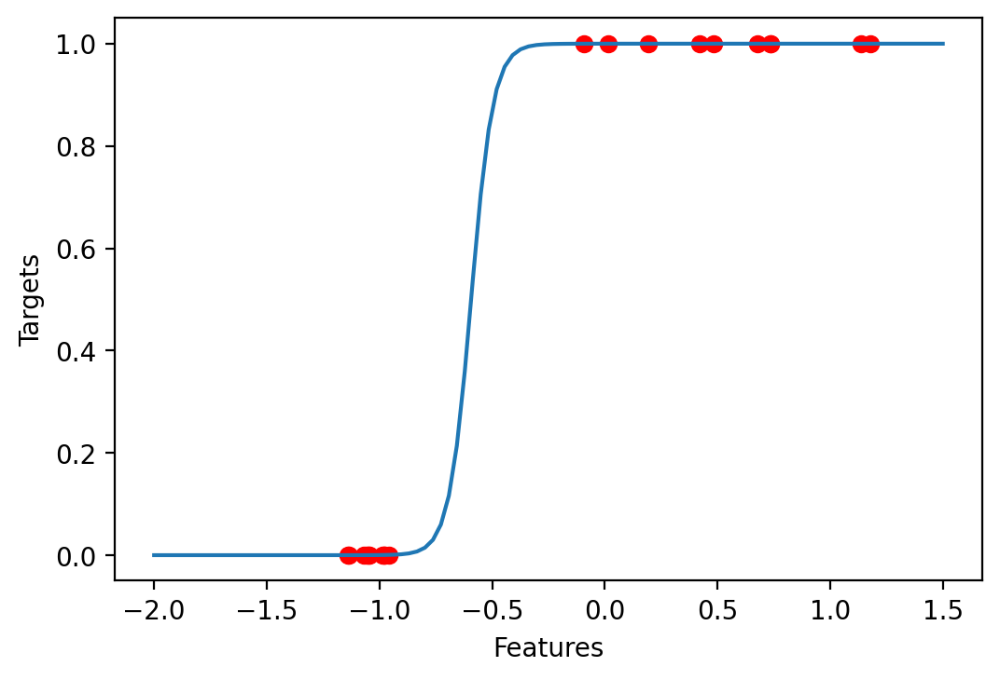

In [ ]:
plt.figure(dpi=200)
plt.xlabel("Features")
plt.ylabel("Targets")
plt.scatter(X, y, c='red')

X_lr = np.linspace(-2, 1.5, 100)
fn = lambda x: sigmoid(beta*x + epsilon)
y_lr = fn(X_lr)

plt.plot(X_lr, y_lr.reshape(-1,))

#### Scikit-Learn Implementation

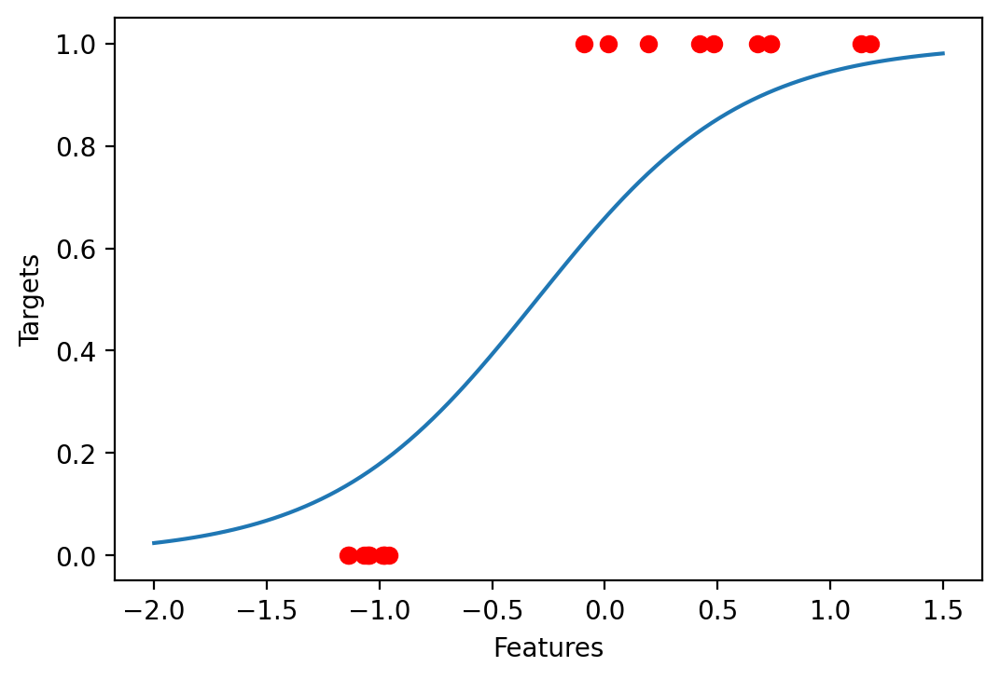

In [ ]:
plt.figure(dpi=200)
plt.xlabel("Features")
plt.ylabel("Targets")
plt.scatter(X, y, c='red')

from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X.reshape(-1, 1), y)
w = lr.coef_
b = lr.intercept_

X_lr = np.linspace(-2, 1.5, 100)
fn = lambda x: sigmoid(w*x + b)
y_lr = fn(X_lr)

plt.plot(X_lr, y_lr.reshape(-1,))

In [ ]:
pred = lr.predict_proba(X)[:, 1]
bce_loss_func(y, pred)

0.1876603136003408

In [ ]:
# regularization logistic regression with L1 penalty
regularization_lr = LogisticRegression(penalty="L1", C=0.5)

### Decision Tree

#### Decision Tree from Scratch

In [ ]:
class Node:
    def __init__(self, best_feature, best_threshold, majority_class):
        self.best_feature = best_feature
        self.best_threshold = best_threshold
        # if this node is at the leaf node, then the majority class in that node will be the prediction during inference
        self.majority_class = majority_class
        # represents the node on the left and the right of the split
        self.left = None
        self.right = None

In [ ]:
class DecisionTree:
    def __init__(self, max_depth):
        self.max_depth = max_depth
    
    def fit(self, X, y):
        self.num_features = X.shape[1]
        self.decision_tree = self.split_tree(X, y, 0)
        return self
    
    def predict(self, X):
        return np.array([self._predict(i) for i in X])
    
    def _predict(self, X):
        curr_node = self.decision_tree
        while curr_node.right:
            if X[curr_node.best_feature] > curr_node.best_threshold:
                curr_node = curr_node.right
            else:
                curr_node = curr_node.left
                
        return curr_node.majority_class
    
    def split_tree(self, X, y, current_depth):
        # Find majority_class first
        num_pos, num_neg = (y == 1).sum(),(y == 0).sum()
        majority_class = np.argmax(np.array([num_neg, num_pos]))
        
        best_ind, best_thresh = self.find_best_split(X, y)
        curr_node = Node(best_ind, best_thresh, majority_class)
        
        if current_depth < self.max_depth and best_ind is not None:
            right_split = X[:, best_ind] > best_thresh
            X_right, y_right, X_left, y_left = X[right_split], y[right_split], X[~right_split], y[~right_split]
            curr_node.left = self.split_tree(X_left, y_left, current_depth + 1)
            curr_node.right = self.split_tree(X_right, y_right, current_depth + 1)
            
        return curr_node
    
    # Returns the index of the best feature and the threshold of the best split of that feature
    def find_best_split(self, X, y):
        # cant split if there's only 1 sample
        if y.size <= 1:
            return None, None
        
        #keeping track of the best threhold and index
        best_index, best_thresh = None, None
    
        # Get the number of positive and negative samples in this node
        num_pos, num_neg = (y == 1).sum(),(y == 0).sum()
        
        # Calculate the Gini Impurity of current node, if no other splits exceeds this, no further split will be performed
        best_impurity = 1 - ((num_pos/len(y))**2 + (num_neg/len(y))**2)
        
        for i in range(self.num_features):
            
            # Sort features values along with their respective labels
            # Threshold associated with their index
            threshold = pd.Series(X[:, 0]).sort_values()
            # Grab the labels in the order of thresholds
            labels = y[threshold.index]
            # Convert threshold to numpy arrays
            threshold = threshold.values
            
            #Keep track of the number of pos, neg samples on both sides with a matrix, [[left_pos, right_pos], [left_neg, right_neg]]
            classes_count = np.array([[0, num_pos], [0, num_neg]])
            
            #len(X) is the number of samples
            for j in range(1, len(y)):
                # get the current sample's label
                curr_label = labels[j-1]    
                # change class count accordingly
                classes_count[curr_label, 0] -= 1
                classes_count[curr_label, 1] += 1
                
                # Calculate Gini Impurity for both sides, then combine with weighted average where the weight is the number of samples on each side, 
                # this cleverly gives us the Gini Impurity for the split
                left_gini = 1 - ((classes_count[0, 0]/j)**2 + (classes_count[1, 0]/j)**2)
                right_gini = 1 - ((classes_count[0, 1]/(len(y)-j))**2 + (classes_count[1, 1]/(len(y)-j))**2)
                gini_combined = left_gini * (j/len(y)) + right_gini * ((len(y)-j)/len(y))
             
                # Make sure we dont use the same threshold
                if threshold[j] == threshold[j-1]:
                    continue
                
                # Set the best threshold to current threshold if we do better than our best gini impurity
                if gini_combined < best_impurity:
                    best_impurity = gini_combined
                    best_index = i
                    best_thresh = (threshold[j-1] + threshold[j])/2
                    
        return best_index, best_thresh

In [ ]:
X, y = make_classification(n_samples = 100, n_features = 3, n_informative = 3, n_redundant = 0, flip_y=0.0, class_sep=1, n_clusters_per_class=1)

In [ ]:
dt = DecisionTree(max_depth=12)
dt.fit(X, y)
predictions = dt.predict(X)

#### Scikit-Learn Implementation of Decision Tree and Random Forest

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt2 = DecisionTreeClassifier(max_depth = 6)
dt2.fit(X, y)
dt2.predict(X)

array([1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0])

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# n_estimators is the number of tree that should be trained
rf = RandomForestClassifier(n_estimators = 30, max_depth = 12)
rf.fit(X, y)
predictions = rf.predict(X)

### Gradient Boosting

#### AdaBoost

In [ ]:
# Classification example

from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
X, y = make_classification(n_samples=1000, n_features=4, n_informative=2, n_redundant=0, random_state=42)
# n_estimator is the amount of stumps
clf = AdaBoostClassifier(n_estimators=100, random_state=0)
# Fit and predict
clf.fit(X, y)
predictions = clf.predict(X)

In [ ]:
# Regression Example

from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import make_regression
X, y = make_regression(n_samples=1000, n_features=4, n_informative=2, random_state=42)
# n_estimator is the amount of stumps
clf = AdaBoostRegressor(n_estimators=100, random_state=0)
# Fit and predict
clf.fit(X, y)
predictions = clf.predict(X)

#### XGBoost

In [ ]:
# Regression Example

import xgboost as xgb
X, y = make_regression(n_samples=1000, n_features=4, n_informative=2, random_state=42)

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# covert data to xgboost data types
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test)
# specify parameters via map
param = {
    'max_depth': 4, 
    # learning rate
    'eta': 0.3, 
    # gamma, pruning term
    'gamma': 10,
    # lambda, regularization term
    'lambda': 1,
    # subsample, the percentage of samples selected to train each tree
    'subsample': 0.8,
    # tasks types, some common ones including binary:logistic, classification with log loss, 
    # multi:softmax, multiclass classification using softmax, binary:logistic, binary classification
    'objective':'reg:squarederror',
    # use GPU
#     'tree_method': 'gpu_hist',
    
}

# numnber of boosted trees
num_round = 200
# train
bst = xgb.train(param, dtrain, num_round)
# make prediction
preds = bst.predict(dtest)

#### LightGBM

In [ ]:
import lightgbm as lgbm 

X, y = make_regression(n_samples=1000, n_features=10, n_informative=10, random_state=42)

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


train_set = lgbm.Dataset(X_train, label=y_train)
params = {
            # number of leafs
            'num_leaves': 15,
            # max depth, counters overfitting when training data is small, but the tree still grows leaf wise
            'max_depth': 12,            
            # max number of bins to seperate continuous features
            'max_bin':200,
            # task type, some other common ones: binary, multiclass, regression_l1
            'objective': 'regression',
            # change to gpu for training on gpu
            'device_type':'cpu',
            # learning rate
            'learning_rate':0.01,
            # amount of logging
            'verbose':0,
            # set random seed for reproducibility 
            'random_seed':0
}

model = lgbm.train(params, train_set, 
                   # number of boosted trees
                   num_boost_round=100,)

predictions = model.predict(X_test)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


---